In [1]:
# Data Manipulation and Preprocessing
import numpy as np
import pandas as pd
import json
import labtools

# Data Visualization
import matplotlib.pyplot as plt

import warnings
# Suppress the SettingWithCopyWarning
warnings.filterwarnings('ignore')

# Web Interaction and Display
from IPython.display import Image, display, HTML

# Additional JavaScript for toggling code display in Jupyter Notebooks
HTML(
    """
<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script>
<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
 } else {
 $('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit"
    value="Click here to toggle on/off the raw code."></form>
"""
)

In [2]:
final_df = pd.read_csv('final_df.csv')

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">SUPPLEMENTARY NOTEBOOK 
        (2016-2020)</h2></center>
</div>

This notebook contains the implementation of the clustering method applied to the abstracts of research publications released between 2016 and 2020.

---

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">TOKEN VECTORIZATION</h2></center>
</div>

This is a snippet of a list of consolidated abstracts of two publications submitted between 2016 and 2020.

In [5]:
# Get the 2016-2020 data
window = list(range(2016, 2021))
df_2016 = final_df[final_df.year.isin(window)]
df_2016 = labtools.get_sample(df_2016, window, sample_size=1000)

# Get the abstract of the 1995 dataset
abs_2016 = df_2016.abstract.to_list()

We next create a matrix representing certain words on this list as a column and their corresponding frequencies within each abstract as values in the matrix. This matrix allows for quantitative analysis of the abstracts based on the occurrence of specific keywords or terms. 

To determine the optimal values for `min_df` and `max_df`, we created a heatmap that shows the sparsity of the TF-IDF matrix for different combinations of `min_df` and `max_df` values. The sparsity is calculated as the ratio of zero elements in the matrix to the total number of elements.

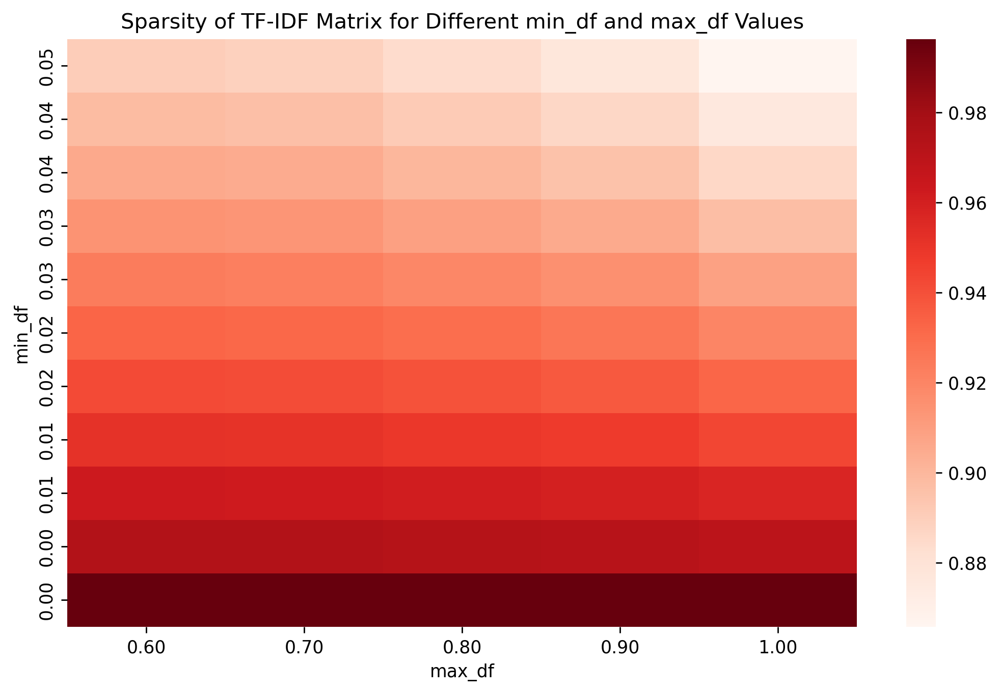

In [7]:
labtools.visualize_sparsity(abs_2016)

<center>
    <h6>
        <b>Figure 1. 
        </b> Sparsity of TF-IDF Matrix for Different <code>min_df</code> and<code>max_df</code> values
    </h6>
</center>

- **Lower right corner (high `min_df`, low `max_df`)**: This region has the lowest sparsity, indicating that most terms are included in the vocabulary due to the lenient filtering.
- **Upper left corner (low `min_df`, high `max_df`)**: This region has the highest sparsity, indicating that many terms have been excluded from the vocabulary due to the aggressive filtering of rare and common terms.
- **Diagonal trend**: As you move from the upper left corner to the lower right corner, the sparsity generally increases. This is because increasing `min_df` and decreasing `max_df` results in more aggressive filtering of the vocabulary.

The heatmap highlights the trade-off between sparsity and vocabulary size. A sparser matrix (higher sparsity) may be more computationally efficient, but it may also exclude important terms. A denser matrix (lower sparsity) includes more terms but may also include noise.

We chose the middle of the heatmap as the optimal region for the values of `min_df` and `max_df`, indicating a balance between including informative terms and excluding noise.

Let's also remove English and context-specific stopwords. Our resulting matrix looks like this:

In [8]:
df_tfidf_16 = labtools.vectorize_abstract(abs_2016, min_df=0.03, max_df=0.80)
df_tfidf_16.head(3)

,ability,accuracy,accurate,achieve,achieved,achieves,addition,additional,address,adversarial,...,unknown,upper,user,users,values,variance,variational,wide,widely,works
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.146285,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.158076
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


<center>
    <h6>
        <b>Table 1. 
        </b>TF-IDF Matrix
    </h6>
</center>

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">DIMENSIONALITY REDUCTION</h2></center>
</div>

Next, we reduce the complexity of the dataset by decreasing the number of its dimensions. We first determine the number of singular vectors that would give us at least 90% of the variance explained using the `TruncatedSVD` method.

Number of components for at least 90% variance explained: 251


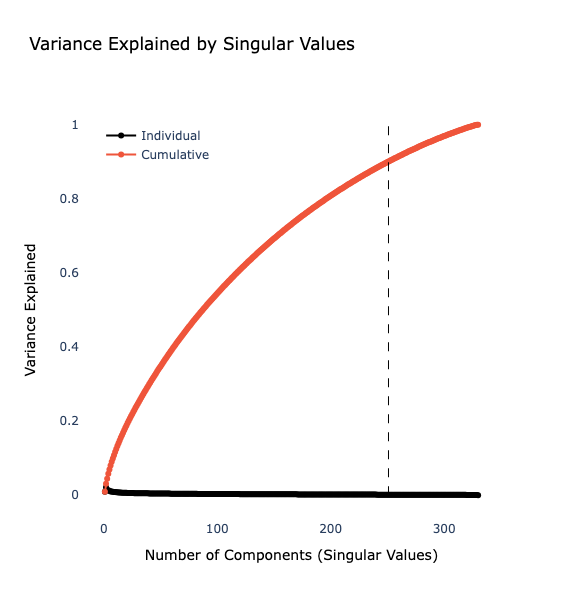

251

In [10]:
labtools.get_n_components(df_tfidf_16, show_viz=True)

<center>
    <h6>
        <b>Figure 2. 
        </b> Individual and Cumulative Variance Explained of the SV Components
    </h6>
</center>


We then proceed to reducing the number of dimensions of our dataset based on the initial check.

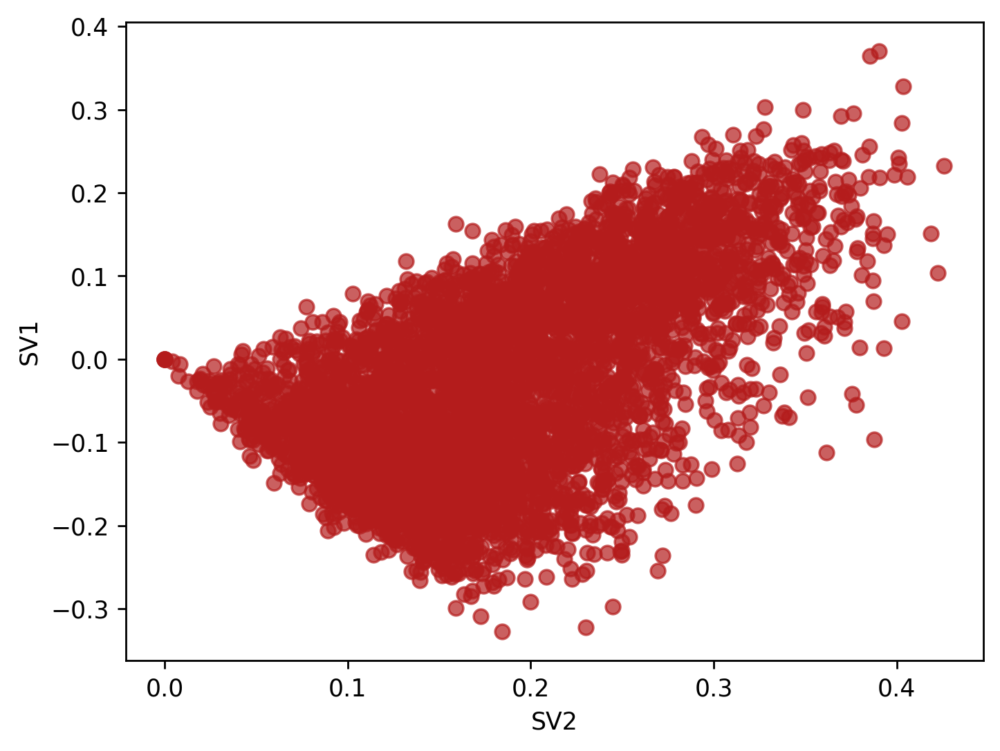

In [11]:
reduced_16 = (labtools.reduce_dimensions(labtools
                                         .get_n_components(df_tfidf_16,
                                                           show_viz=False),
                                         df_tfidf_16))
plt.figure(dpi=250)
plt.scatter(reduced_16[:, 0], reduced_16[:, 1], alpha=0.7, color='#b41c1c')
plt.xlabel('SV2')
plt.ylabel('SV1');

<center>
    <h6>
        <b>Figure 3. 
        </b> The TF-IDF as projected to the first two singular vectors
    </h6>
</center>


<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">CLUSTERING</h2></center>
</div>

Optimal number of clusters: 2
Threshold distance: 7.269544


7.269544266351152

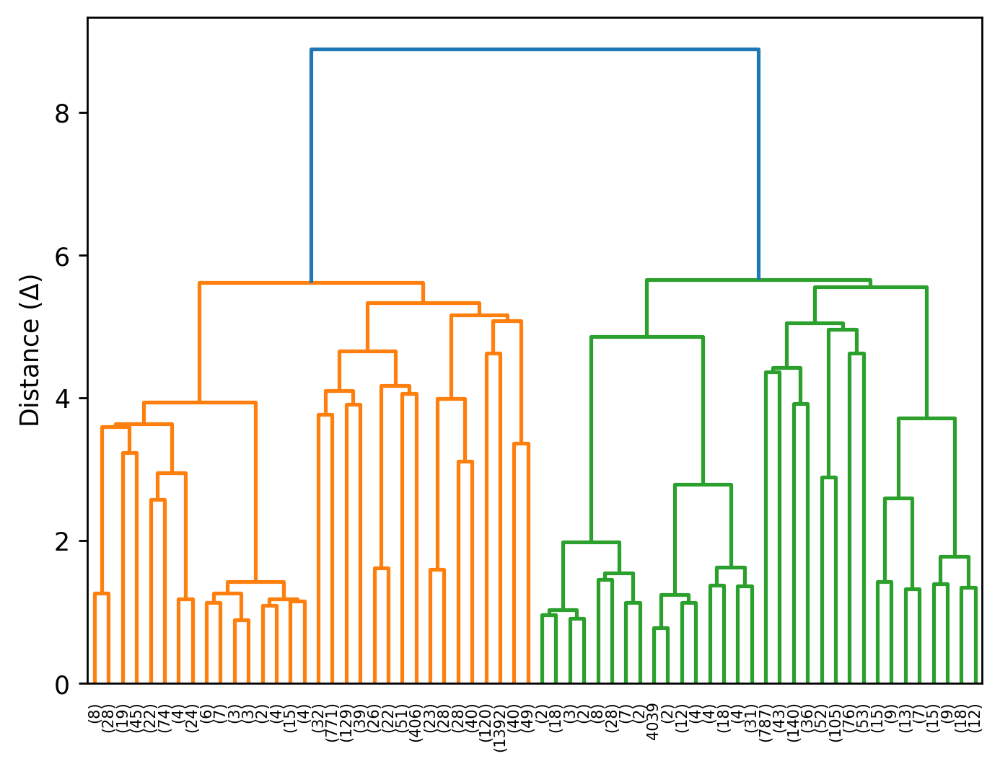

In [12]:
labtools.hierarchical_clustering(reduced_16)

<center>
    <h6>
        <b>Figure 4. 
        </b> Ward's Clustering Dendrogram Results
    </h6>
</center>


From the dendrogram, we see that the optimal number of clusters is two. However, it would be interesting to investigate the sub-clusters that were formed under each main cluster because we can see that one main cluster has more points, so it is possible that we can further find subgroups under it. Let's check these both.

<div style="background-color: #cbc6c6; padding: 10px 0;">
    <center><h4 style="color: #242424;font-weight:bold">EDA on Main Clusters</h4></center>
</div>

Let's first check the two main clusters. This is what it looks when projected on the first two singular vectors:

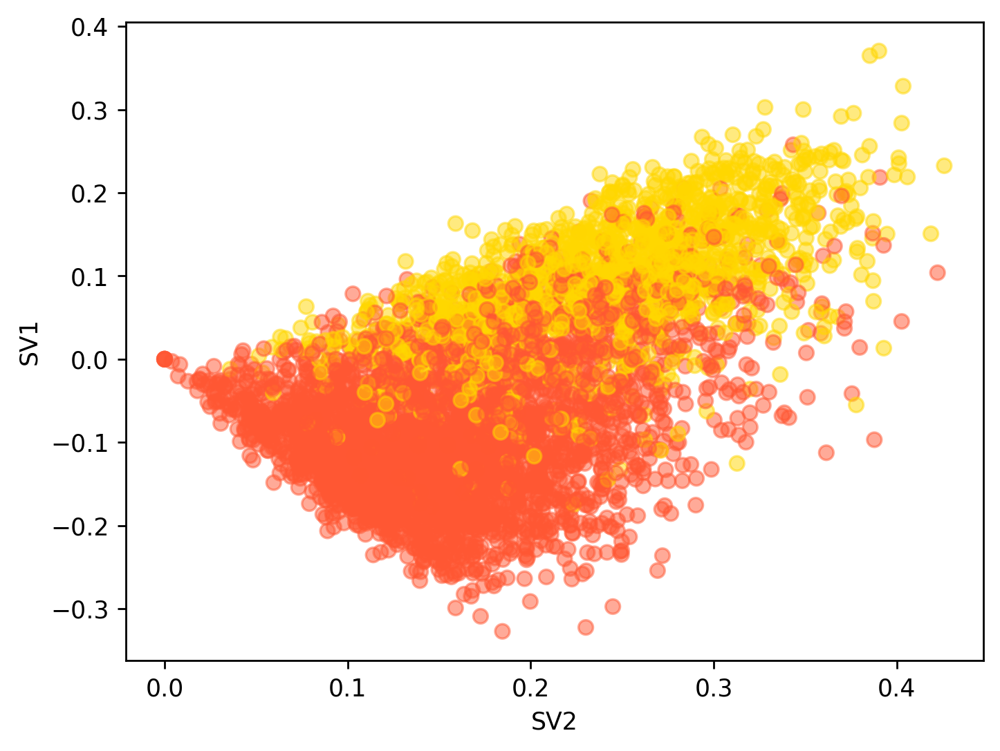

In [13]:
labtools.cluster_predict(reduced_16, df_2016, show_viz=True)

<center>
    <h6>
        <b>Figure 5. 
        </b> Clustering Results as Projected on the First Two Singular Vectors
    </h6>
</center>

Let's visualize the abstracts of the publications belonging to each main cluster using a word cloud to have an idea on what the cluster is all about.

In [14]:
clustered_df = labtools.cluster_predict(reduced_16, df_2016, show_viz=False,
                               get_updated_df=True)

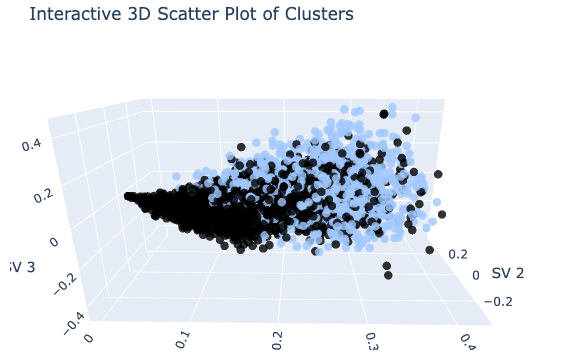

In [18]:
import plotly.graph_objects as go

# Assuming you have already performed dimensionality reduction
# and have reduced data stored in reduced_06 DataFrame

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=reduced_16[:, 0],
    y=reduced_16[:, 1],
    z=reduced_16[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=clustered_df['cluster'],  # Color points based on cluster
        colorscale='blackbody',  # Choose a color scale
        opacity=0.8
    ),
    text=clustered_df['cluster'].astype(str)  # Add cluster labels as text
)])

# Set axis labels
fig.update_layout(scene=dict(
    xaxis_title='SV 1',
    yaxis_title='SV 2',
    zaxis_title='SV 3',
    aspectratio=dict(x=2, y=1, z=1)  # Adjust the aspect ratio as needed
))

# Adjust the layout to fill the entire space while keeping the controls visible
fig.update_layout(
    autosize=True,  # Enable autosizing to keep controls visible
    margin=dict(l=10, r=10, t=40, b=10),  # Adjust margin values for control visibility
)

# Add title to the plot
fig.update_layout(title='Interactive 3D Scatter Plot of Clusters')

# Show the plot
fig.show()


#### **Cluster 1: 2016-2020**

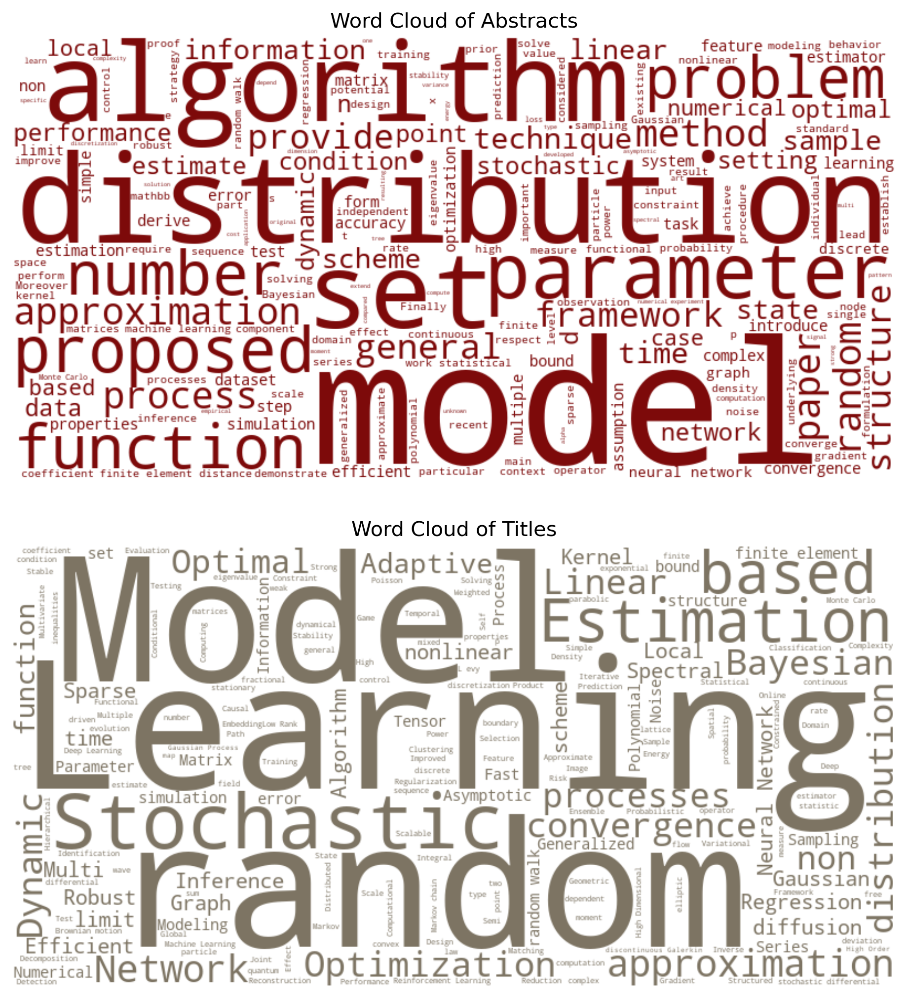

In [15]:
labtools.generate_wordclouds(clustered_df, cluster_number=1)

<center>
    <h6>
        <b>Figure 6. 
        </b> Word Cloud of Initial Cluster 1 (2016-2020)
    </h6>
</center>

#### **Cluster 2: 2016-2020**

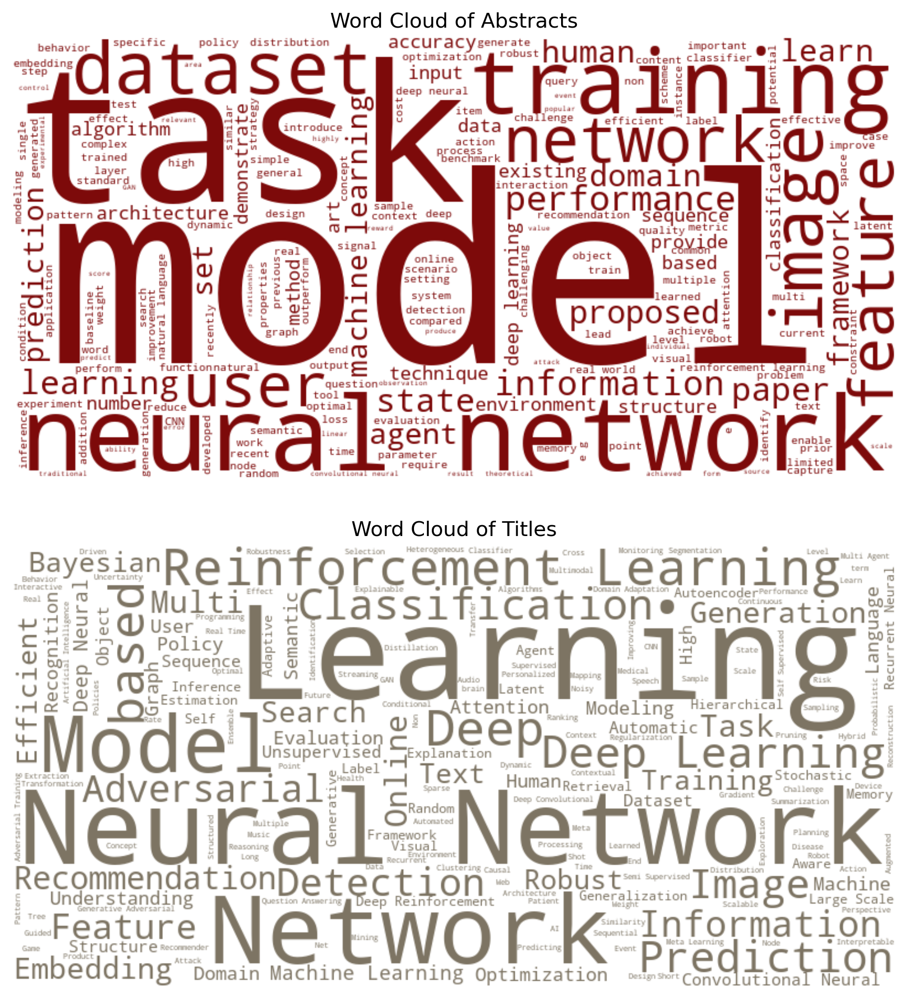

In [16]:
labtools.generate_wordclouds(clustered_df, cluster_number=2)

<center>
    <h6>
        <b>Figure 7. 
        </b> Word Cloud of Initial Cluster 2 (2016-2020)
    </h6>
</center>

**How imbalanced are our main clusters between 2016 and 2020?**

As we can see, Cluster 1 has significantly more points than Cluster 2. 

<p style='color:red'>compare the size of neural network analysis to previous years</p>

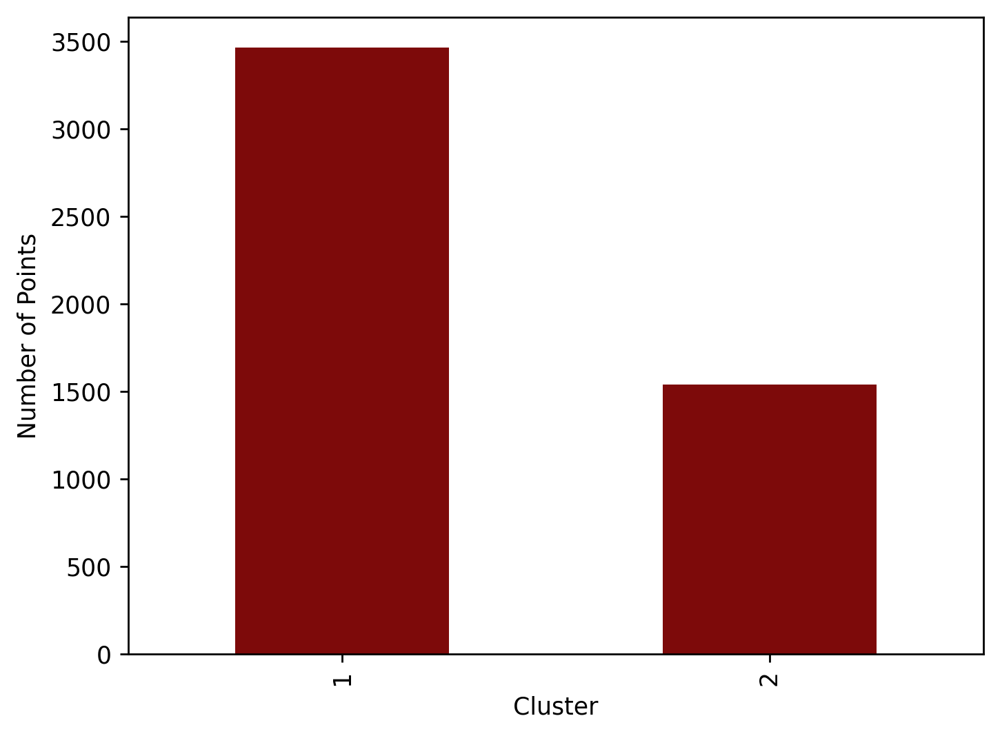

In [17]:
plt.figure(dpi=250)
clustered_df.cluster.value_counts().plot(kind='bar', color='#7d0a0a',
                                         xlabel='Cluster',
                                         ylabel='Number of Points');

<center>
    <h6>
        <b>Figure 8. 
        </b> Visualizing the Distribution of Points to the Initial Clusters
    </h6>
</center>

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">CLUSTER INTERPRETATION</h2></center>
</div>

#### **Cluster 1: Stochastic Models and Algorithmic Optimization**
- **Abstract Keywords**: distribution, algorithm, model, set, parameter
- **Title Keywords**: Stochastic, model, random, algorithm, distribution, set, approximation, adaptive, optimization
- **Insight**: The keywords suggest a focus on developing and refining stochastic models while simultaneously exploring algorithms for optimization, adaptation, and approximation. It’s akin to a merging of the clusters observed in previous periods.

#### **Cluster 2: Advanced Machine Learning Techniques with Emerging Focus on Neural Networks and Image Processing**
- **Abstract Keywords**: task, neural, network, learning, training, dataset, image, feature, user
- **Title Keywords**: neural, network, reinforcement learning, classification, image, information, prediction, detection, convolution neural, adversarial
- **Insight**: The cluster focuses on neural networks, particularly their application in image processing tasks such as classification, prediction, and detection. The cluster likely explores various aspects of neural network architectures, including convolutional neural networks (CNNs) and their utilization in tasks like reinforcement learning and adversarial training. The keywords suggest an emphasis on utilizing neural networks for image-related tasks, potentially involving both supervised and unsupervised learning techniques.